# Predicting &Preventing Customer Churn

# Data understanding 

In [6]:
#import necessary Libraries
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
import scipy.stats as stats
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt
import math

plt.style.use('seaborn')
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, BaseEstimator
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, BaseEnsemble
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, make_scorer, recall_score
from imblearn.pipeline import make_pipeline, Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import plotly.express as px
from sklearn.metrics import confusion_matrix


In [7]:
#reading from csv file
df = pd.read_csv('bigml_59c28831336c6604c800002a.csv')
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [12]:
#checking for the shape of the data frame
df.shape

(3333, 21)

In [13]:
#checking the overal data feame inforation
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

1. the data frame entails 8 float ,8 integers,4 objects and 1 bool

it occupies memory usage of 524.2 KB


# Data cleaning

To clean the data in preparation for analysis, we start with :

1. Check duplicates .

2. Drop duplicates if necessary.

3. check the dependant variable (value_counts)

4. Identify and handle NAN (Not a Number) or missing values.

5. Check for place holders 

6. Convert date data types if necessary.

7. Identify outliers and either drop or keep them depending on the study objective.

8. Determining columns that are irrelevant for the analysis and drop them.

In [6]:
#checking for the sum of duplicates
df.duplicated().sum()

0

In [7]:
#checking for the sum of missing values
df.isnull().sum()

state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

In [8]:

len(df['state'].unique())

51

In [9]:
# Check balance of target data 
df['churn'].value_counts()

False    2850
True      483
Name: churn, dtype: int64

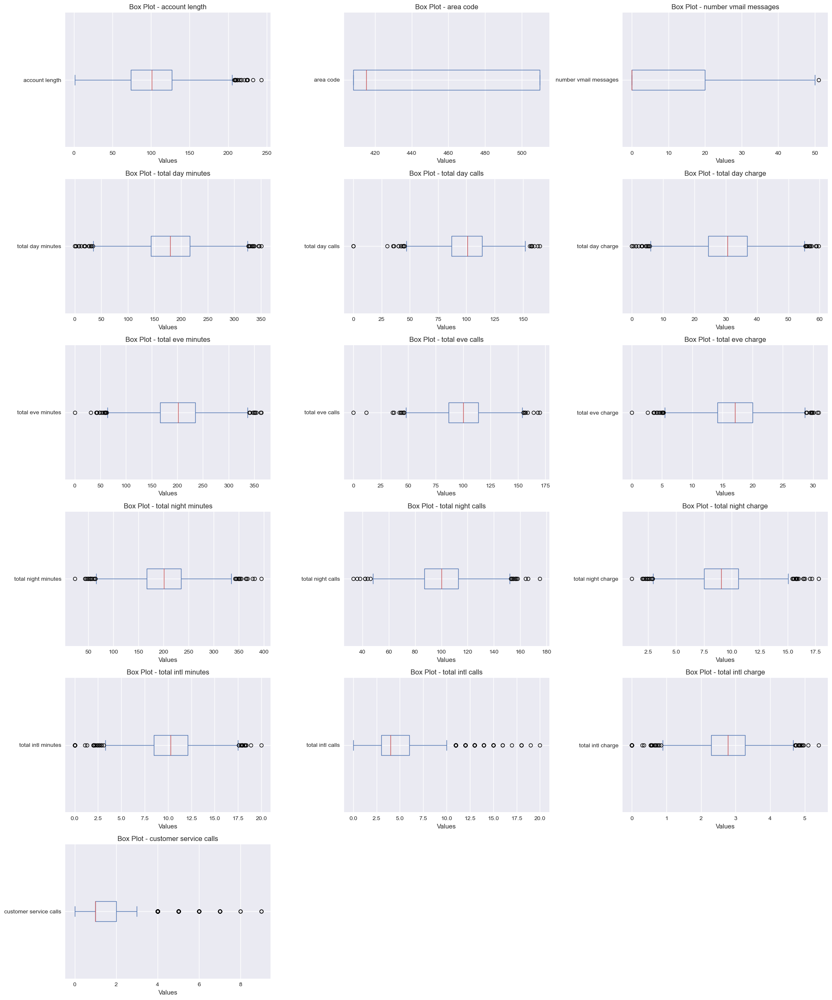

In [10]:

#boxplots for all numerical variables 

# Select all numerical columns for box plot
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Calculate the number of rows and columns for subplots
num_cols = len(numerical_columns)
num_rows = math.ceil(num_cols / 3)  # Assuming 3 columns per row

# Create individual box plots for each numerical column
plt.figure(figsize=(20, 4 * num_rows))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(num_rows, 3, i)
    df[col].plot(kind='box', vert=False)
    plt.title(f'Box Plot - {col}')
    plt.xlabel('Values')

plt.tight_layout()
plt.show()


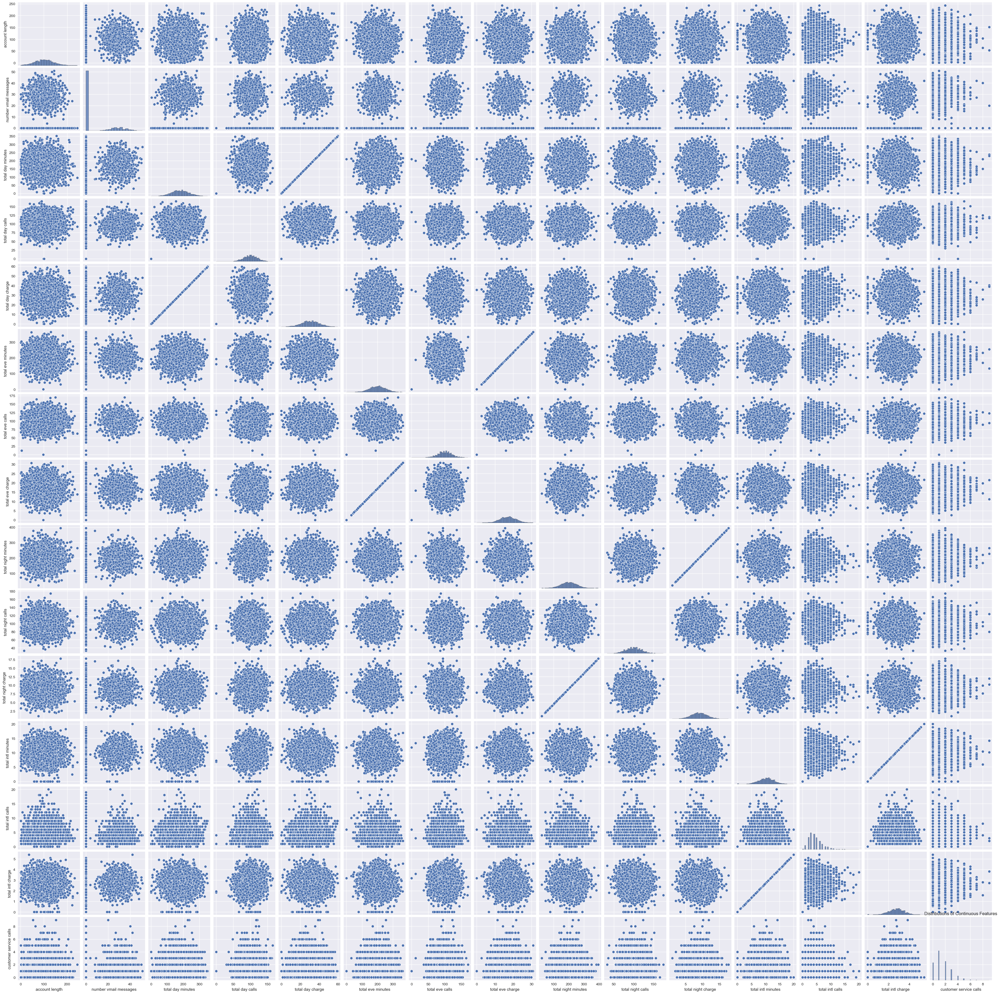

In [11]:
# Check spread of data for major outliers
cont_df = df.drop(columns=['state', 'phone number', 'international plan', 'voice mail plan', 'churn', 'area code'])

sns.pairplot(cont_df)
plt.title('Distributions of Continuous Features')
plt.show()

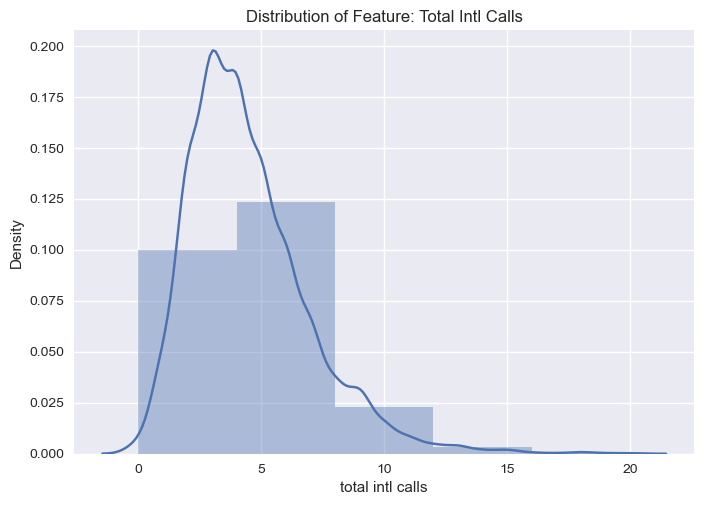

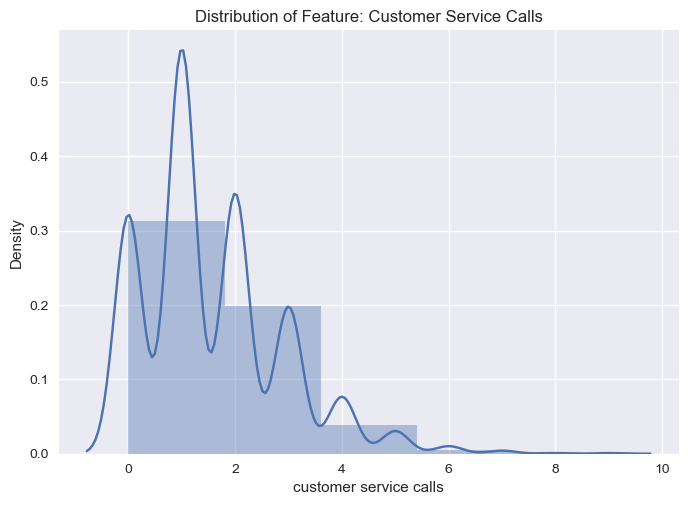

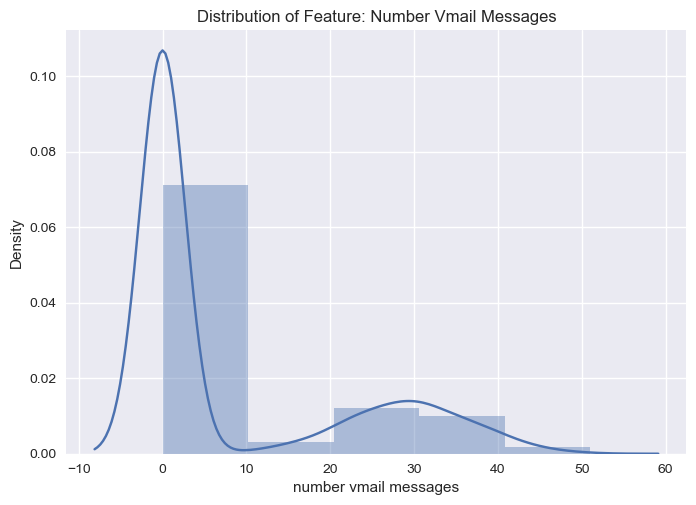

In [12]:
# looking into this  3  distributions
for col in ['total intl calls', 'customer service calls', 'number vmail messages']:
    sns.distplot(df[col], bins=5)
    plt.title(f'Distribution of Feature: {col.title()}')
    plt.show()

# Data analysis  

# univeriate analysis  

In [13]:
# Summary statistics for all numerical features
df.describe()

,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [14]:
df_train, df_validation = train_test_split(df, test_size=.1, random_state=1)
print(df_train.shape, df_validation.shape)

(2999, 21) (334, 21)


In [15]:
df_validation.to_csv('validation_set.csv')

In [16]:
df_train.to_csv('training_set.csv')

10% of our data is utilized as a validation set, which is blind to all of the modeling operations we perform but is ultimately used to assess the model's quality. I divided it up and put it in a csv file for later use.

In [17]:
#Determine Churn and Retention Rates
churn_rate = df_train['churn'].mean()
retention_rate = 1 - churn_rate

# Print the Results
print(f"Churn Rate: {churn_rate:.2%}")
print(f"Retention Rate: {retention_rate:.2%}")


Churn Rate: 14.34%
Retention Rate: 85.66%


In [18]:
#Filtered DataFrame for Churned Customers with More than One Customer Service Call
df_train.loc[(df_train['customer service calls'] > 1) & (df_train['churn'] == True)]

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
3304,IL,71,510,330-7137,yes,no,0,186.1,114,31.64,...,140,16.88,206.5,80,9.29,13.8,5,3.73,4,True
2402,NY,77,415,388-9285,no,yes,33,143.0,101,24.31,...,102,18.04,104.9,120,4.72,15.3,4,4.13,5,True
1919,WA,100,408,382-4932,no,no,0,70.8,94,12.04,...,102,18.33,230.8,125,10.39,9.5,1,2.57,6,True
2980,KS,84,415,335-7144,no,no,0,225.9,86,38.40,...,105,23.43,201.4,108,9.06,14.3,3,3.86,3,True
3255,RI,138,510,411-6823,yes,no,0,286.2,61,48.65,...,60,15.91,146.2,114,6.58,11.0,4,2.97,2,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319,SD,128,510,413-9269,yes,yes,32,223.5,81,38.00,...,74,16.05,154.9,101,6.97,9.4,2,2.54,2,True
3287,KS,170,415,404-5840,no,yes,42,199.5,119,33.92,...,90,11.48,184.6,49,8.31,10.9,3,2.94,4,True
144,VT,117,408,390-2390,yes,no,0,167.1,86,28.41,...,87,15.09,249.4,132,11.22,14.1,7,3.81,2,True
905,WV,161,415,418-9036,no,no,0,191.9,113,32.62,...,87,6.03,204.8,107,9.22,13.4,4,3.62,4,True


In [19]:
#Filtered DataFrame for Customers with More than One Customer Service Call
df_train.loc[df_train['customer service calls'] > 1]

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
3304,IL,71,510,330-7137,yes,no,0,186.1,114,31.64,...,140,16.88,206.5,80,9.29,13.8,5,3.73,4,True
2402,NY,77,415,388-9285,no,yes,33,143.0,101,24.31,...,102,18.04,104.9,120,4.72,15.3,4,4.13,5,True
756,WY,33,415,331-3202,no,no,0,213.9,88,36.36,...,119,20.38,148.7,71,6.69,9.8,14,2.65,2,False
133,TX,82,408,400-3446,no,no,0,200.3,96,34.05,...,102,17.10,206.1,60,9.27,7.1,1,1.92,4,False
366,NC,112,415,334-1872,no,no,0,193.3,96,32.86,...,123,22.45,128.6,115,5.79,9.1,3,2.46,4,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144,VT,117,408,390-2390,yes,no,0,167.1,86,28.41,...,87,15.09,249.4,132,11.22,14.1,7,3.81,2,True
960,AR,5,415,380-2758,no,no,0,199.2,106,33.86,...,12,15.92,214.0,85,9.63,13.3,3,3.59,3,False
2763,NC,116,408,338-7527,no,yes,19,155.7,104,26.47,...,118,15.76,192.7,116,8.67,8.2,2,2.21,3,False
905,WV,161,415,418-9036,no,no,0,191.9,113,32.62,...,87,6.03,204.8,107,9.22,13.4,4,3.62,4,True


In [20]:

# Count of Customer Service Calls Distribution in the Training Dataset
customer_service = df_train['customer service calls'].value_counts().reset_index()
customer_service.columns = ['customer service calls', 'count']
customer_service

,customer service calls,count
0,1,1066
1,2,676
2,0,630
3,3,392
4,4,146
5,5,57
6,6,20
7,7,8
8,8,2
9,9,2


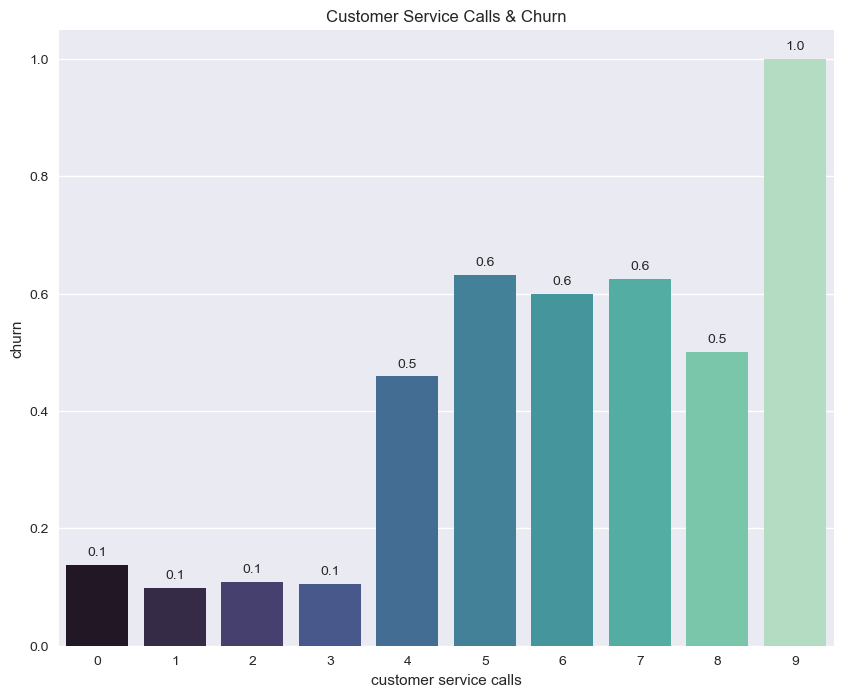

In [21]:
#ploting a box plot for Customer service and churn
plt.figure(figsize=(10, 8))
splot = sns.barplot(x='customer service calls', y='churn',
                    data=df_train, palette='mako', ci=None)
# Add annotations to bars
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.title('Customer Service Calls & Churn')
plt.show()

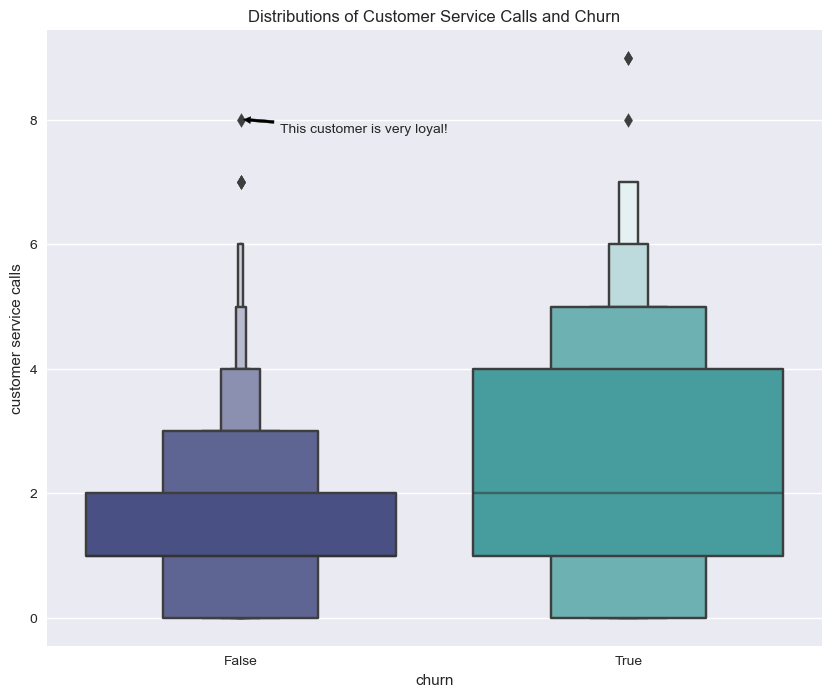

In [22]:
# That loyal customer is probably an outlier,will need to deal with him in the modeling stage
plt.figure(figsize=(10, 8))
sns.boxenplot(x='churn', y='customer service calls',
              data=df_train, palette='mako')

plt.annotate('This customer is very loyal!', xy=(0, 8.01), xytext=(0.1, 7.8),
            arrowprops=dict(facecolor='black', arrowstyle='simple'))

plt.title('Distributions of Customer Service Calls and Churn')
plt.show()


In [23]:
# How much are people using their plan? What can this tell us about churn?

# First look at how much people use their regular plans
df_calls = df_train[['total day calls', 'total eve calls', 'total night calls', 'churn']]
df_calls.head()

,total day calls,total eve calls,total night calls,churn
2682,77,100,92,False
3304,114,140,80,True
757,108,111,78,False
2402,101,102,120,True
792,98,102,85,True


In [24]:
calls = df_calls.groupby('churn').sum()
calls.reset_index()

,churn,total day calls,total eve calls,total night calls
0,False,257671,256525,256621
1,True,43432,43113,43039


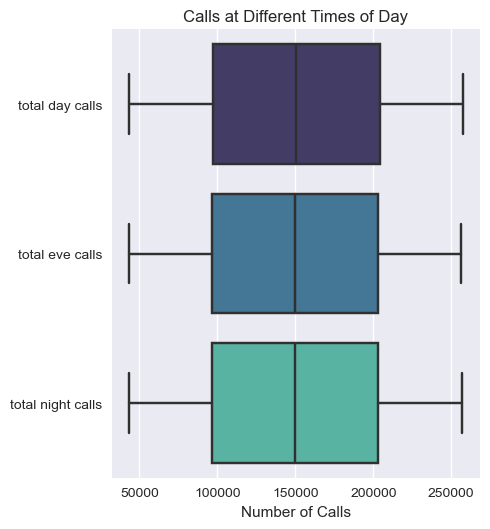

In [25]:
#graph for different times of Day
sns.catplot(data=calls, orient="h", kind="box", palette='mako')
plt.title('Calls at Different Times of Day')
plt.xlabel('Number of Calls')
plt.show()

In [26]:
# What are the calling rates? (Checked mean and median and random ones... they're all the same)
day_rate = (df_train['total day charge'] / df_train['total day minutes']).median()
eve_rate = (df_train['total eve charge'] / df_train['total eve minutes']).median()
night_rate = (df_train['total night charge'] / df_train['total night minutes']).median()
intl_rate = (df_train['total intl charge'] / df_train['total intl minutes']).median()

names = ['Day Rate', 'Eve Rate', 'Night Rate', 'Intl Rate']

for name, rate in zip(names, [day_rate, eve_rate, night_rate, intl_rate]):
    print(f'{name}:', round(rate, 2))

Day Rate: 0.17
Eve Rate: 0.09
Night Rate: 0.04
Intl Rate: 0.27


In [27]:
df_intl = df_train.loc[df_train['international plan'] == 'yes']
df_non_intl = df_train.loc[df_train['international plan'] == 'no']

In [28]:
intl_plan_rate = (df_intl['total intl charge'] / df_intl['total intl minutes']).median()
non_intl_plan_rate = (df_non_intl['total intl charge'] / df_non_intl['total intl minutes']).median()
print(intl_plan_rate, non_intl_plan_rate)
# They are the same!

0.27 0.270063694267516


In [29]:
intl_churn = pd.DataFrame(df_intl['churn'].value_counts(normalize=True), columns=['churn'])
non_intl_churn = pd.DataFrame(df_non_intl['churn'].value_counts(normalize=True), columns=['churn'])

display(intl_churn)
display(non_intl_churn)

,churn
False,0.571918
True,0.428082


,churn
False,0.887329
True,0.112671


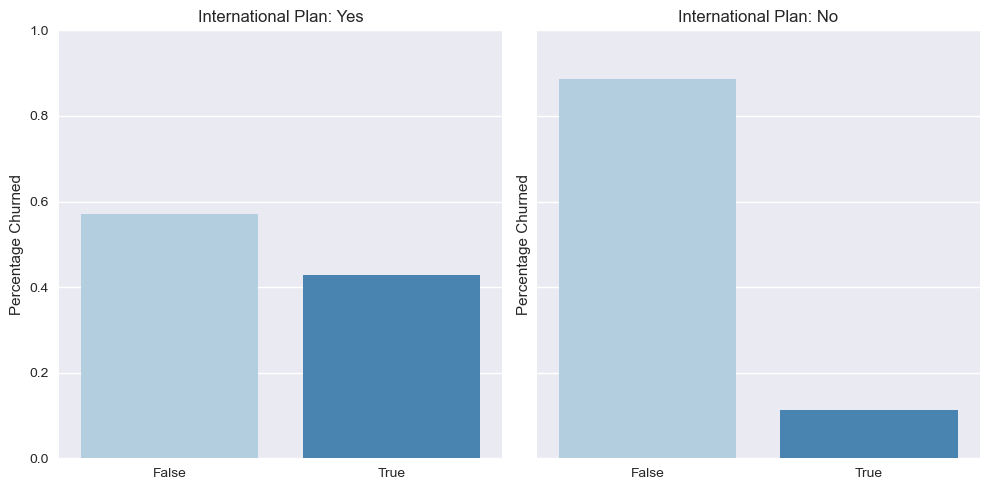

In [30]:
f, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
sns.barplot(x=['False', 'True'], y='churn', data=intl_churn, ax=axes[0], palette='Blues')
sns.barplot(x=['False', 'True'], y='churn', data=non_intl_churn, ax=axes[1], palette='Blues')
axes[0].set_title('International Plan: Yes')
axes[1].set_title('International Plan: No')
axes[0].set_ylabel('Percentage Churned')
axes[1].set_ylabel('Percentage Churned')
plt.ylim(0,1)
plt.tight_layout()
plt.show()

In [31]:
#Lokking into its mean
df_train.groupby('international plan')['total intl calls'].mean()

international plan
no     4.482453
yes    4.623288
Name: total intl calls, dtype: float64

In [32]:
df_train.groupby('international plan')['total intl charge'].mean()


international plan
no     2.753170
yes    2.878459
Name: total intl charge, dtype: float64

In [33]:
# Whether or not people have an international plan, they still average the same number of total intl calls and charges

# Create functions to create new features so we can use them later in a pipeline 

def create_total_calls_column(df):
    
    """
    creates a column of the total customer calls, excluding customer service calls
    returns the df with new column
    """
    
    df['total calls'] = df['total day calls'] + df['total eve calls'] + df['total night calls'] + df['total intl calls']
    return df

def create_minutes_per_intl_call(df):
    
    """
    creates a column of the average length (in minutes) per international call 
    returns the df with new column
    """
    
    df['avg minutes per intl call'] = df['total intl minutes'] / df['total intl calls']
    return df

In [34]:
# Create 2 new features on the training data set
df_train = create_minutes_per_intl_call(df_train)
df_train = create_total_calls_column(df_train)

In [35]:
df_train.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn,avg minutes per intl call,total calls
2682,DC,55,510,354-5058,yes,no,0,106.1,77,18.04,...,96.4,92,4.34,12.9,3,3.48,0,False,4.300,272
3304,IL,71,510,330-7137,yes,no,0,186.1,114,31.64,...,206.5,80,9.29,13.8,5,3.73,4,True,2.760,339
757,UT,112,415,358-5953,no,no,0,115.8,108,19.69,...,184.6,78,8.31,13.1,5,3.54,1,False,2.620,302
2402,NY,77,415,388-9285,no,yes,33,143.0,101,24.31,...,104.9,120,4.72,15.3,4,4.13,5,True,3.825,327
792,NV,69,510,397-6789,yes,yes,33,271.5,98,46.16,...,165.4,85,7.44,8.2,2,2.21,1,True,4.100,287


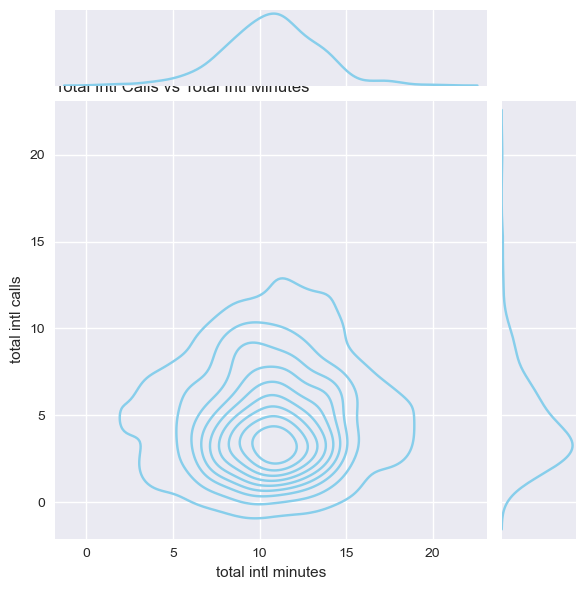

In [36]:
sns.jointplot(x=df_intl["total intl minutes"], y=df_intl["total intl calls"], kind='kde', color="skyblue")
plt.title('Total Intl Calls vs Total Intl Minutes', loc='left')
plt.show()
# This tells us that most of the intl calls are relatively short (2-4 mins long)

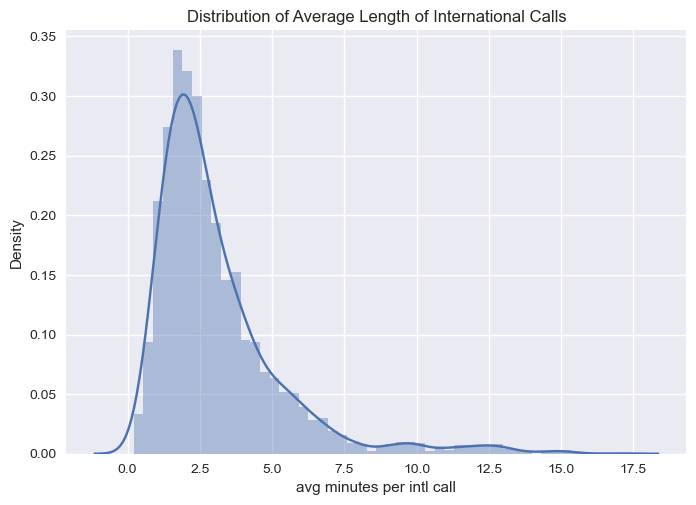

In [37]:
sns.distplot(df_train['avg minutes per intl call'])
plt.title('Distribution of Average Length of International Calls')
plt.show()

In [38]:
stacked_bar_data = df_train.groupby('churn').sum().reset_index()
stacked_bar_data

,churn,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,avg minutes per intl call,total calls
0,False,258560,1122642,22015,449548.1,257671,76424.54,512365.8,256525,43551.72,513363.8,256621,23101.62,26106.1,11709,7050.03,3716,7694.886751,782526
1,True,43692,188415,2194,88889.3,43432,15111.40,91290.1,43113,7759.73,88447.3,43039,3980.15,4604.0,1775,1243.31,957,1548.873101,131359


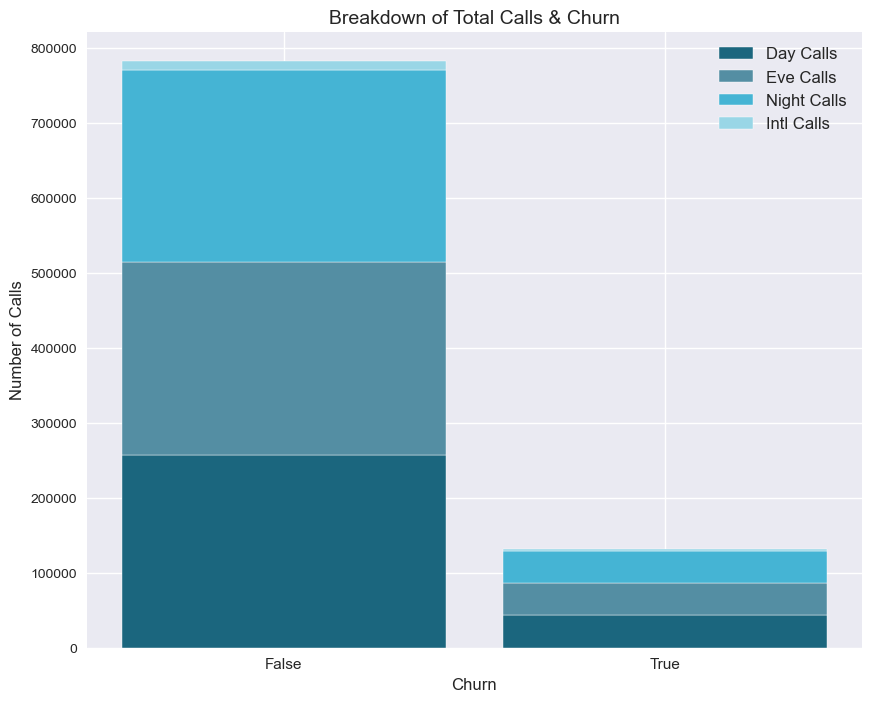

In [39]:
# Create an awesome stacked bar graph of all calls
r = stacked_bar_data['churn']
 
# Values
totals = stacked_bar_data['total calls']
DayBars = stacked_bar_data['total day calls']
EveBars = stacked_bar_data['total eve calls']
NightBars = stacked_bar_data['total night calls']
IntlBars = stacked_bar_data['total intl calls']

# Plot
plt.figure(figsize=(10,8))
names = ('False', 'True')
barWidth = 0.85

# Create Day Bars
plt.bar(r, DayBars, color='#1b667e', edgecolor='white',
        width=barWidth, label='Day Calls')

# Create Eve Bars
plt.bar(r, EveBars, bottom=DayBars, color='#548ea3',
        edgecolor='white', width=barWidth, label='Eve Calls')

# Create Night Bars
plt.bar(r, NightBars, bottom=[i+j for i,j in zip(DayBars, EveBars)],
        color='#45b4d4', edgecolor='white', width=barWidth, label='Night Calls')

# Create Intl Bars
plt.bar(r, IntlBars, bottom=[i+j+k for i,j,k in zip(DayBars, EveBars, NightBars)],
        color='#99d6e6', edgecolor='white', width=barWidth, label='Intl Calls')

# Graph details
plt.xticks(r, names, fontsize=11)
plt.xlabel('Churn', fontsize=12)
plt.ylabel('Number of Calls', fontsize=12)
plt.title('Breakdown of Total Calls & Churn', fontsize=14)
plt.legend(loc=1, fontsize='large')

# Show graph
plt.show()

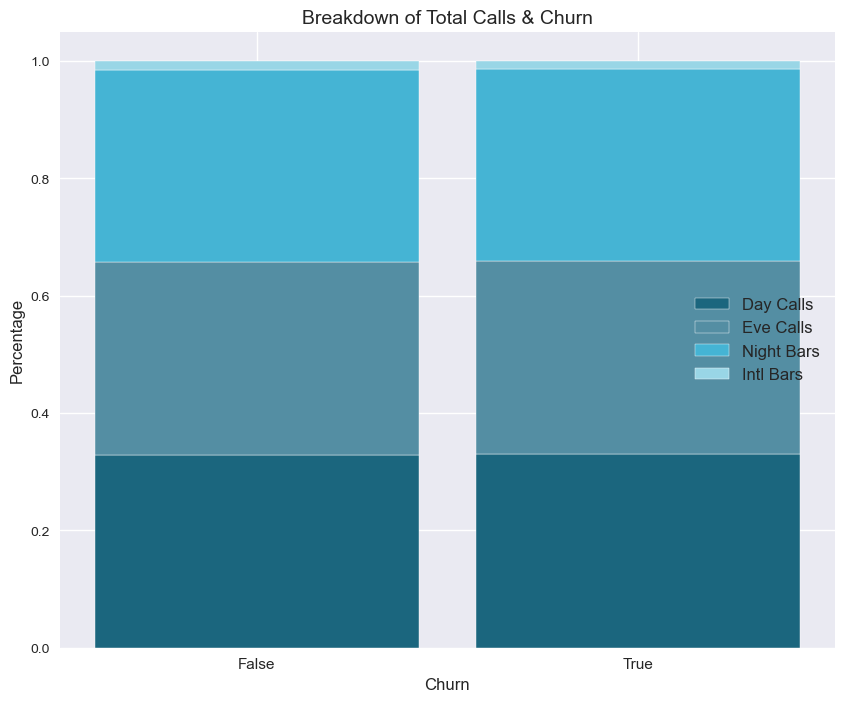

In [40]:
# Create an awesome stacked bar graph of all calls
r = stacked_bar_data['churn']
 
# Turn values to percentage
totals = stacked_bar_data['total calls']
DayBars = stacked_bar_data['total day calls'] / totals
EveBars = stacked_bar_data['total eve calls'] / totals
NightBars = stacked_bar_data['total night calls'] / totals
IntlBars = stacked_bar_data['total intl calls'] / totals

# Plota
plt.figure(figsize=(10,8))
names = ('False', 'True')
barWidth = 0.85

# Create Day Bars
plt.bar(r, DayBars, color='#1b667e', edgecolor='white',
        width=barWidth, label='Day Calls')

# Create Eve Bars
plt.bar(r, EveBars, bottom=DayBars, color='#548ea3',
        edgecolor='white', width=barWidth, label='Eve Calls')

# Create Night Bars
plt.bar(r, NightBars, bottom=[i+j for i,j in zip(DayBars, EveBars)],
        color='#45b4d4', edgecolor='white', width=barWidth, label='Night Bars')

# Create Intl Bars
plt.bar(r, IntlBars, bottom=[i+j+k for i,j,k in zip(DayBars, EveBars, NightBars)],
        color='#99d6e6', edgecolor='white', width=barWidth, label='Intl Bars')

# Graph details
plt.xticks(r, names, fontsize=11)
plt.xlabel('Churn', fontsize=12)
plt.ylabel('Percentage', fontsize=12)
plt.title('Breakdown of Total Calls & Churn', fontsize=14)
plt.legend(loc=7, fontsize='large')

# Show graph
plt.show()

# Are customers in certain areas more likely to churn?

In [41]:
# Obviously this doesn't tell us much if there are only 3 area codes across 50 states + DC
# We are better off using states
display(df_train['state'].unique())
display(df_train['area code'].unique())

array(['DC', 'IL', 'UT', 'NY', 'NV', 'KY', 'WY', 'MT', 'NE', 'CT', 'MO',
       'SC', 'DE', 'CO', 'IN', 'NM', 'TX', 'FL', 'ND', 'AL', 'OK', 'NC',
       'MA', 'VA', 'VT', 'MD', 'KS', 'MN', 'WA', 'AZ', 'IA', 'AK', 'MI',
       'OR', 'WV', 'GA', 'MS', 'OH', 'ID', 'WI', 'SD', 'HI', 'LA', 'ME',
       'RI', 'NJ', 'AR', 'NH', 'CA', 'TN', 'PA'], dtype=object)

array([510, 415, 408], dtype=int64)

In [42]:
churn_by_state = df_train.groupby('state')['churn'].value_counts(normalize=True)
churn_by_state = pd.DataFrame(churn_by_state)
churn_by_state.columns = ['value']
churn_by_state = churn_by_state.reset_index()

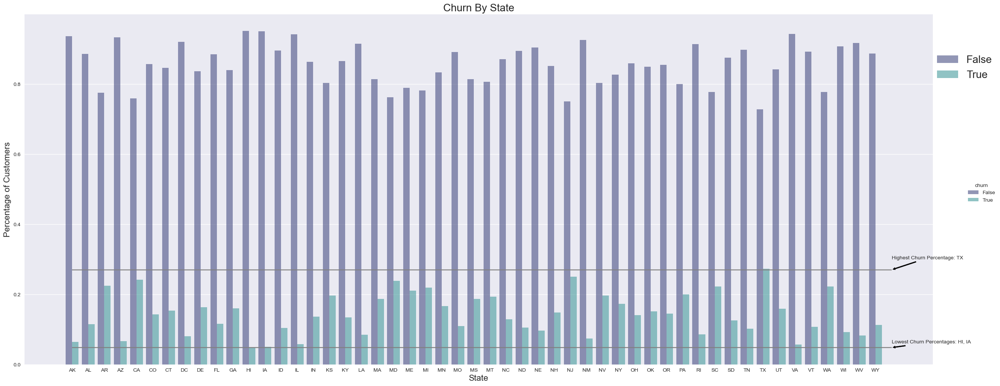

In [43]:
# Plot
sns.catplot(data=churn_by_state, kind='bar',
            x='state', y='value', hue='churn',
            palette='mako', alpha=.6, height=10, aspect=2.5)

# Graph details
plt.title('Churn By State', fontsize=20)
plt.ylabel('Percentage of Customers', fontsize=16)
plt.xlabel('State', fontsize=16)
plt.legend(loc=(1, .8), fontsize=20)

# hlines on highest and lowest churns
plt.hlines(y=.27, xmin=0, xmax=51, color='gray')
plt.hlines(y=.048, xmin=0, xmax=51, color='gray')

# annotate highest and lowest churns
plt.annotate('Highest Churn Percentage: TX', xy=(51, .27), xytext=(51, .3),
            arrowprops=dict(facecolor='black', arrowstyle='simple'))
plt.annotate('Lowest Churn Percentages: HI, IA', xy=(51, .048), xytext=(51, .06),
            arrowprops=dict(facecolor='black', arrowstyle='simple'))

plt.show()

In [44]:
churn_by_state.loc[(churn_by_state['value'] > .23) & (churn_by_state['churn'] == True)]

,state,churn,value
9,CA,True,0.241379
41,MD,True,0.238095
63,NJ,True,0.250000
87,TX,True,0.272727


In [45]:
churn_by_state.loc[churn_by_state['value'] <= .05]

,state,churn,value
23,HI,True,0.04878
25,IA,True,0.05000


In [46]:
lowest_churn_percent = churn_by_state.loc[churn_by_state['value'] <= .05]
highest_churn_percent = churn_by_state.loc[(churn_by_state['value'] > .23) & (churn_by_state['churn'] == True)]

In [47]:
churn_choropleth = churn_by_state.loc[churn_by_state['churn']==True]

In [48]:
fig = px.choropleth(data_frame=churn_choropleth, locations='state', locationmode="USA-states",
                    color='value', scope="usa", title='States with Highest Churn Percentage',
                    color_continuous_scale='Blues')
fig.show()

In [49]:
high_competition = churn_by_state.loc[(churn_by_state['value'] >= .2) & (churn_by_state['churn'] == True)]
high_competition['state'].unique()

array(['AR', 'CA', 'MD', 'ME', 'MI', 'NJ', 'PA', 'SC', 'TX', 'WA'],
      dtype=object)

In [50]:
med_high_competition = churn_by_state.loc[(churn_by_state['value'] >= .15) & (churn_by_state['value'] < .2) & (churn_by_state['churn'] == True)]
med_high_competition['state'].unique()

array(['CT', 'DE', 'GA', 'KS', 'MA', 'MN', 'MS', 'MT', 'NV', 'NY', 'OK',
       'UT'], dtype=object)

In [51]:
medium_competition = churn_by_state.loc[(churn_by_state['value'] < .15) & (churn_by_state['value'] >= .10) & (churn_by_state['churn'] == True)]
medium_competition['state'].unique()

array(['AL', 'CO', 'FL', 'ID', 'IN', 'KY', 'MO', 'NC', 'ND', 'NH', 'OH',
       'OR', 'SD', 'TN', 'VT', 'WY'], dtype=object)

In [52]:
low_competition = churn_by_state.loc[(churn_by_state['value'] < .1) & (churn_by_state['churn'] == True)]
low_competition['state'].unique()

array(['AK', 'AZ', 'DC', 'HI', 'IA', 'IL', 'LA', 'NE', 'NM', 'RI', 'VA',
       'WI', 'WV'], dtype=object)

In [53]:
def categorize_state(state):
    
    """
    Encodes states in terms of how much competition is present in that market.
    Returns each encoded state.
    """
    
    if state in ['AK', 'AZ', 'DC', 'HI', 'IA', 'IL', 'LA', 'NE', 'NM', 'RI', 'VA', 'WI', 'WV']:
        state = 1
    elif state in ['AL', 'CO', 'FL', 'ID', 'IN', 'KY', 'MO', 'NC', 'ND', 'NH', 'OH', 'OR', 'SD', 'TN', 'VT', 'WY']:
        state = 2
    elif state in ['CT', 'DE', 'GA', 'KS', 'MA', 'MN', 'MS', 'MT', 'NV', 'NY', 'OK', 'UT']:
        state = 3
    else:
        state = 4
    return state


def create_competition_feat(df):
    
    """
    Creates the competition feature, which encodes each state in regards to how much competition is present.
    Returns entire df with new feature.
    """
    
    df['competiton'] = df['state'].apply(categorize_state)
    return df

In [54]:
create_competition_feat(df_train)

df_train.head(20)

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn,avg minutes per intl call,total calls,competiton
2682,DC,55,510,354-5058,yes,no,0,106.1,77,18.04,...,92,4.34,12.9,3,3.48,0,False,4.300000,272,1
3304,IL,71,510,330-7137,yes,no,0,186.1,114,31.64,...,80,9.29,13.8,5,3.73,4,True,2.760000,339,1
757,UT,112,415,358-5953,no,no,0,115.8,108,19.69,...,78,8.31,13.1,5,3.54,1,False,2.620000,302,3
2402,NY,77,415,388-9285,no,yes,33,143.0,101,24.31,...,120,4.72,15.3,4,4.13,5,True,3.825000,327,3
792,NV,69,510,397-6789,yes,yes,33,271.5,98,46.16,...,85,7.44,8.2,2,2.21,1,True,4.100000,287,3
933,KY,74,510,368-7555,yes,no,0,125.8,103,21.39,...,143,9.33,14.1,4,3.81,1,True,3.525000,346,2
756,WY,33,415,331-3202,no,no,0,213.9,88,36.36,...,71,6.69,9.8,14,2.65,2,False,0.700000,292,2
804,MT,72,415,398-8385,no,no,0,253.0,73,43.01,...,89,9.49,9.8,4,2.65,0,False,2.450000,244,3
1966,NE,77,415,350-1532,no,no,0,169.4,102,28.80,...,89,10.54,2.0,7,0.54,1,False,0.285714,342,1
1804,CT,125,415,409-7523,yes,no,0,187.3,118,31.84,...,112,11.87,9.6,2,2.59,0,True,4.800000,343,3


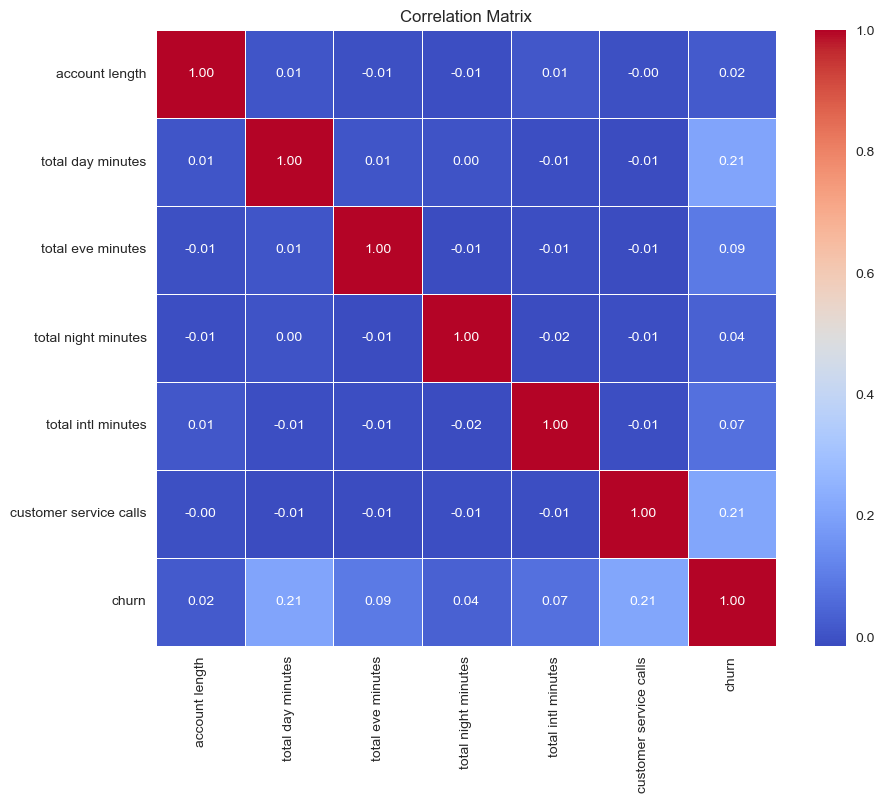

In [55]:
# Compute correlations between numerical features and the target variable 'churn'
numerical_features = ['account length', 'total day minutes', 'total eve minutes', 'total night minutes', 'total intl minutes', 'customer service calls']
correlation_matrix = df[numerical_features + ['churn']].corr()

# Visualize correlations using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

Positive Correlation (Values closer to 1):

'total day minutes' has a positive correlation of approximately 0.21 with 'churn.' This suggests that customers with higher total day minutes are slightly more likely to churn.

'customer service calls' has a positive correlation of approximately 0.21 with 'churn.' This indicates that as the number of customer service calls increases, the likelihood of churn also increases.

Negative Correlation (Values closer to -1):

'number vmail messages' has a negative correlation of approximately -0.09 with 'churn.' This implies that customers with more voice mail messages are slightly less likely to churn.

Weak Correlations (Values close to 0):

Most other correlations are relatively weak, indicating a limited linear relationship.

# modeling

In [56]:
df_train.to_csv('training_set.csv')
df_train.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn,avg minutes per intl call,total calls,competiton
2682,DC,55,510,354-5058,yes,no,0,106.1,77,18.04,...,92,4.34,12.9,3,3.48,0,False,4.300,272,1
3304,IL,71,510,330-7137,yes,no,0,186.1,114,31.64,...,80,9.29,13.8,5,3.73,4,True,2.760,339,1
757,UT,112,415,358-5953,no,no,0,115.8,108,19.69,...,78,8.31,13.1,5,3.54,1,False,2.620,302,3
2402,NY,77,415,388-9285,no,yes,33,143.0,101,24.31,...,120,4.72,15.3,4,4.13,5,True,3.825,327,3
792,NV,69,510,397-6789,yes,yes,33,271.5,98,46.16,...,85,7.44,8.2,2,2.21,1,True,4.100,287,3


In [57]:
data_to_use = ['account length', 'international plan', 'voice mail plan', 'number vmail messages',
                   'total day charge', 'total eve charge', 'total night charge', 'total intl charge',
                   'customer service calls']
target = ['churn']

In [59]:
def transform_df(df):
    """
    Transforms yes and no values in certain columns of the df to 1s and 0s, respectively. 
    Returns the dataframe.
    """
    df['international plan'] = df['international plan'].apply(lambda x: 1 if x.lower() == 'yes' else 0)
    df['voice mail plan'] = df['voice mail plan'].apply(lambda x: 1 if x.lower() == 'yes' else 0)
    return df

def plot_conf_matrix(y_true, y_pred):
    """
    Plots a prettier confusion matrix than matplotlib.
    """
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, cmap=sns.color_palette('Blues_d'), fmt='0.5g', annot_kws={"size": 16})
    plt.xlabel('Predictions')
    plt.ylabel('Actuals')
    plt.ylim([0, 2])
    plt.show()



In [60]:
df_train_transformed = transform_df(df_train)
df_train_transformed.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn,avg minutes per intl call,total calls,competiton
2682,DC,55,510,354-5058,1,0,0,106.1,77,18.04,...,92,4.34,12.9,3,3.48,0,False,4.300,272,1
3304,IL,71,510,330-7137,1,0,0,186.1,114,31.64,...,80,9.29,13.8,5,3.73,4,True,2.760,339,1
757,UT,112,415,358-5953,0,0,0,115.8,108,19.69,...,78,8.31,13.1,5,3.54,1,False,2.620,302,3
2402,NY,77,415,388-9285,0,1,33,143.0,101,24.31,...,120,4.72,15.3,4,4.13,5,True,3.825,327,3
792,NV,69,510,397-6789,1,1,33,271.5,98,46.16,...,85,7.44,8.2,2,2.21,1,True,4.100,287,3


In [61]:
X = df_train_transformed[data_to_use]
y = df_train_transformed[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=1)
X_train.shape, X_test.shape

((2249, 9), (750, 9))

In [62]:

# Use Smote to resample and fix the class imbalance problem
from imblearn.over_sampling import SMOTE
smote = SMOTE()
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)


In [63]:
rf1 = RandomForestClassifier()
rf1.fit(X_train_resampled, y_train_resampled)

RandomForestClassifier()

In [64]:
y_preds_test = rf1.predict(X_test)
y_preds_train = rf1.predict(X_train_resampled)

print('Training Recall:', recall_score(y_train_resampled, y_preds_train))
print('Testing Recall:', recall_score(y_test, y_preds_test))

Training Recall: 1.0
Testing Recall: 0.7446808510638298


## Model Selection:
### Perform Test to Select Best Classifie

Model: RandomForestClassifier()
Training Recall: 1.0
Testing Recall: 0.7340425531914894


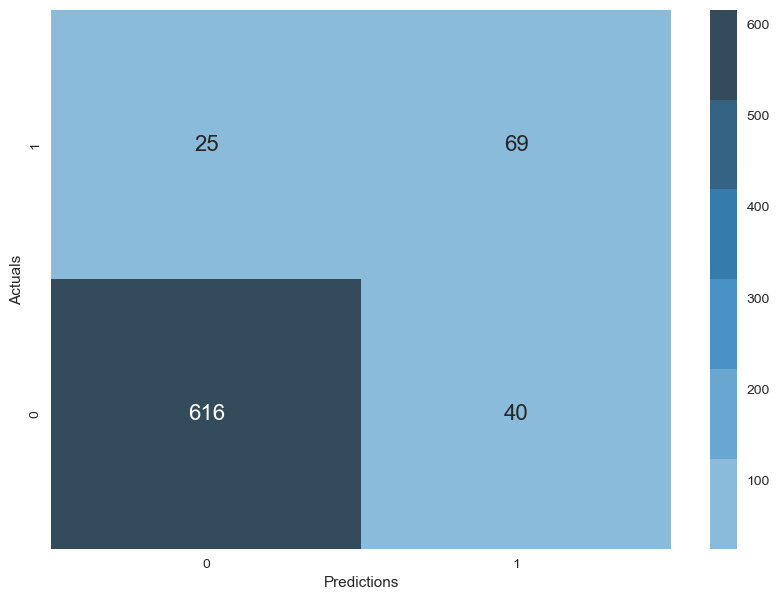


 ---------------------------------- 

Model: KNeighborsClassifier()
Training Recall: 0.9790904338734971
Testing Recall: 0.6063829787234043


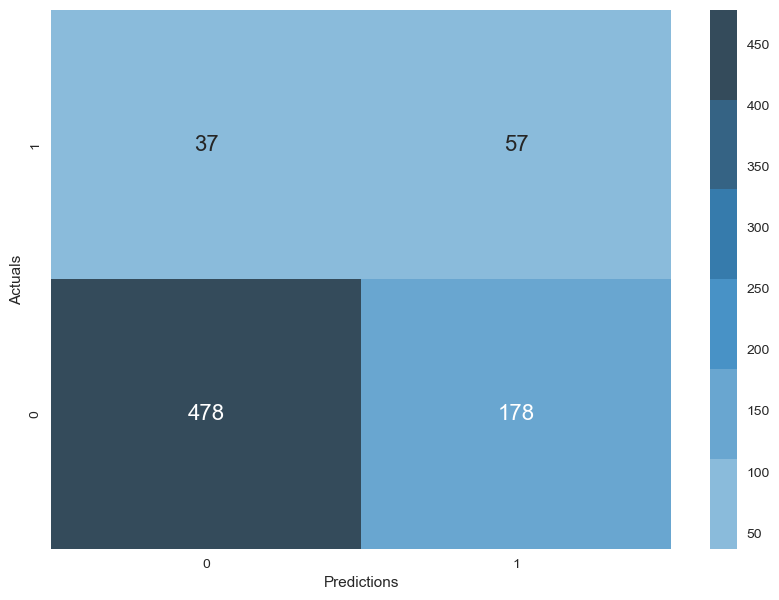


 ---------------------------------- 

Model: GradientBoostingClassifier()
Training Recall: 0.7553580763199164
Testing Recall: 0.7446808510638298


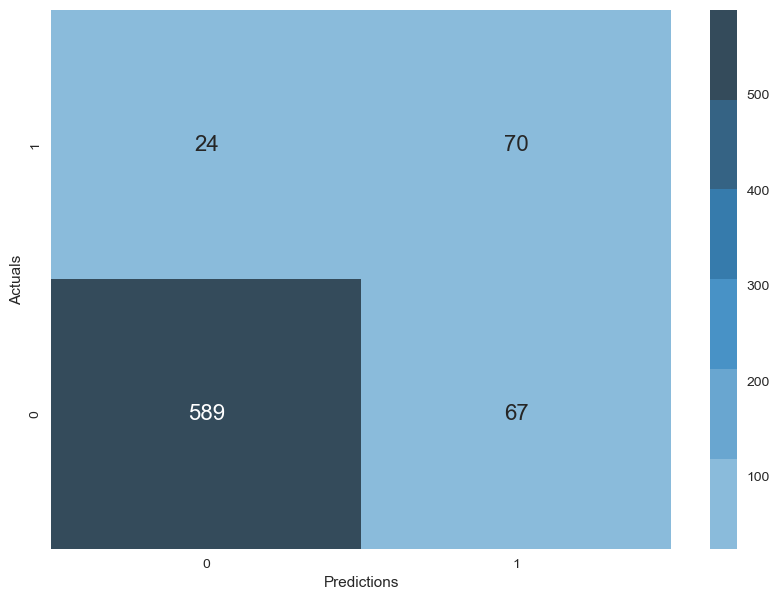


 ---------------------------------- 

Model: GaussianNB()
Training Recall: 0.7522216414009409
Testing Recall: 0.7872340425531915


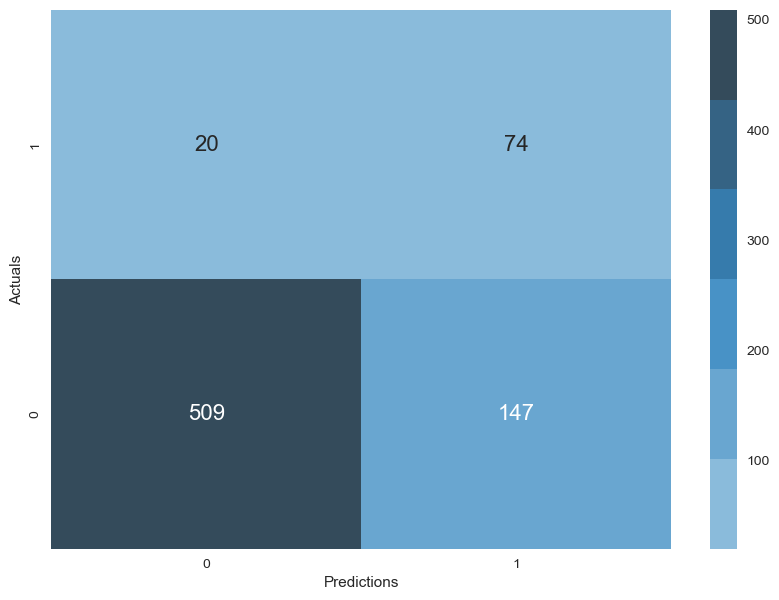


 ---------------------------------- 

Model: SVC()
Training Recall: 0.46680606377417666
Testing Recall: 0.5851063829787234


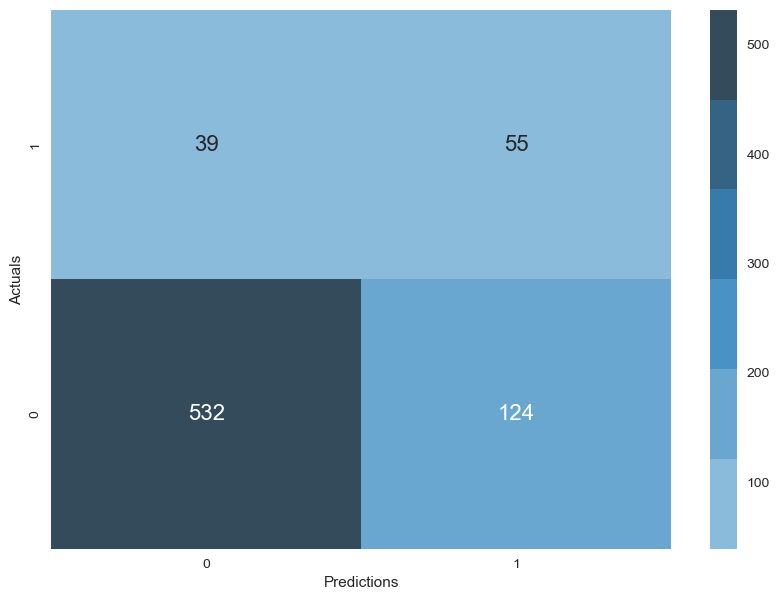


 ---------------------------------- 



In [65]:
rf = RandomForestClassifier()
knn = KNeighborsClassifier()
gboost = GradientBoostingClassifier()
gbayes = GaussianNB()
svm = SVC()

models = [rf, knn, gboost, gbayes, svm]

for model in models:
    model.fit(X_train_resampled, y_train_resampled)
    y_preds_test = model.predict(X_test)
    y_preds_train = model.predict(X_train_resampled)
    print('Model:', model)
    print('Training Recall:', recall_score(y_train_resampled, y_preds_train))
    print('Testing Recall:', recall_score(y_test, y_preds_test))
    plot_conf_matrix(y_test, y_preds_test)
    print('\n ---------------------------------- \n')

**Notes:**

The best performing classifiers here were Gradient Boost, and Gaussian Naive Bayes. They both had the lowest False Negatives and the least overfitting. I would like to redo the KNN model with a scaler to see if that helps it perform better (distance is very much affected by the scales of the features). 

It is also important to note that I did not do any hypertuning yet, nor feature engineering. I am only checking initally which model might do the best with this dataset.

New KNN Model:
Training Recall: 0.0
Testing Recall: 0.0


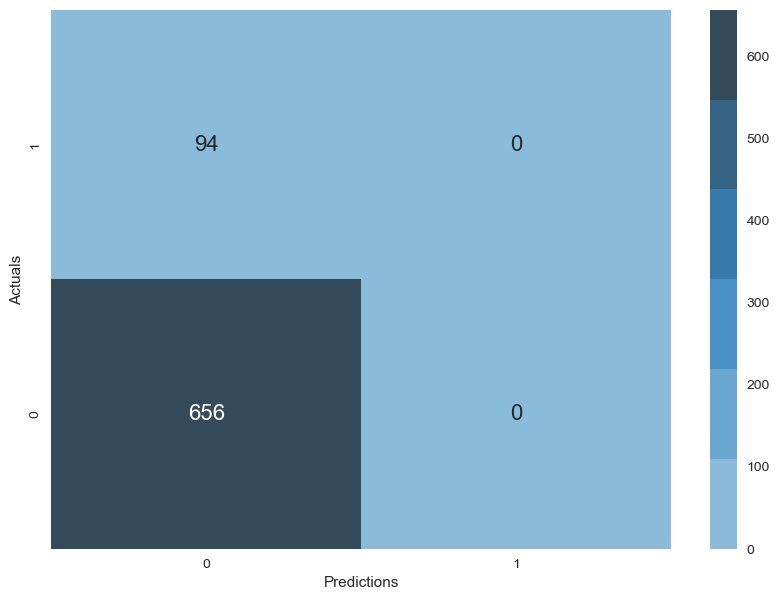

In [66]:
# Redo the KNN model with feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

knn.fit(X_train_scaled, y_train_resampled)

y_preds_test = model.predict(X_test_scaled)
y_preds_train = model.predict(X_train_scaled)
print('New KNN Model:')
print('Training Recall:', recall_score(y_train_resampled, y_preds_train))
print('Testing Recall:', recall_score(y_test, y_preds_test))
plot_conf_matrix(y_test, y_preds_test)

## Set up the Pipeline 

**Steps**

1) Choose Columns (need to build a class for this)

2) Transform categorical columns and build features (need a custom class for this too)

3) Deal with class imbalance using SMOTE (imblearn's pipeline will only apply this step to training set)

4) Build model and predict (use existing sklearn methods)

In [67]:
# Functions to build features

def categorize_state(state):
    if state in ['AK', 'AZ', 'DC', 'HI', 'IA', 'IL', 'LA', 'NE', 'NM', 'RI', 'VA', 'WI', 'WV']:
        state = 1
    elif state in ['AL', 'CO', 'FL', 'ID', 'IN', 'KY', 'MO', 'NC', 'ND', 'NH', 'OH', 'OR', 'SD', 'TN', 'VT', 'WY']:
        state = 2
    elif state in ['CT', 'DE', 'GA', 'KS', 'MA', 'MN', 'MS', 'MT', 'NV', 'NY', 'OK', 'UT']:
        state = 3
    else:
        state = 4
    return state


def build_features(X):
    X['total charge'] = X['total day charge'] + X['total eve charge'] + X['total night charge'] + X['total intl charge']
    X['total minutes'] = X['total day minutes'] + X['total eve minutes'] + X['total night minutes'] + X['total intl minutes']
    X['total calls'] = X['total day calls'] + X['total eve calls'] + X['total night calls'] + X['total intl calls']
    X['avg minutes per domestic call'] = (X['total minutes'] - X['total intl minutes']) / (X['total calls'] - X['total intl calls'])
    X['competition'] = X['state'].apply(categorize_state)
    return X

In [68]:
# Build custom classes to build into the pipeline

class SelectColumnsTransformer(BaseEstimator):
    
    def __init__(self, columns=None):
        self.columns = columns
        
    def transform(self, X, **transform_params):
        cpy_df = X[self.columns].copy()
        return cpy_df

    def fit(self, X, y=None, **fit_params):
        return self
    
    
class Transform_Categorical(BaseEstimator):
    
    def transform(self, X, y=None, **transform_params):
        try:
            X['international plan'] = X['international plan'].apply(self.yes_no_func)
            X['voice mail plan'] = X['voice mail plan'].apply(self.yes_no_func)
        except:
            pass
        return X

    def fit(self, X, y=None, **fit_params):
        return self
    
    @staticmethod
    def yes_no_func(x):
        return 1 if x.lower() == 'yes' else 0

In [69]:
df_with_features = build_features(df_train)
df_with_features.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total intl charge,customer service calls,churn,avg minutes per intl call,total calls,competiton,total charge,total minutes,avg minutes per domestic call,competition
2682,DC,55,510,354-5058,1,0,0,106.1,77,18.04,...,3.48,0,False,4.300,272,1,36.36,338.9,1.211896,1
3304,IL,71,510,330-7137,1,0,0,186.1,114,31.64,...,3.73,4,True,2.760,339,1,61.54,605.0,1.770060,1
757,UT,112,415,358-5953,0,0,0,115.8,108,19.69,...,3.54,1,False,2.620,302,3,52.22,556.8,1.830640,3
2402,NY,77,415,388-9285,0,1,33,143.0,101,24.31,...,4.13,5,True,3.825,327,3,51.20,475.4,1.424458,3
792,NV,69,510,397-6789,1,1,33,271.5,98,46.16,...,2.21,1,True,4.100,287,3,77.35,698.5,2.422105,3


In [70]:
data_to_use = ['account length', 'international plan', 'voice mail plan', 'number vmail messages',
                   'total charge', 'customer service calls', 'competition',
                   'avg minutes per domestic call', 'total calls', 'total minutes']
target = ['churn']

In [71]:
pipeline = Pipeline(steps= [
                    ("ColumnTransformer", SelectColumnsTransformer(columns=data_to_use)),
                    ("TransformCategorical", Transform_Categorical()),
                    ("SMOTE", SMOTE()),
                    ("GradientBooster", GradientBoostingClassifier())
                    ])

In [72]:
X_train = df_with_features.drop(columns=['churn'])
y_train = df_with_features[target]

In [73]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('ColumnTransformer',
                 SelectColumnsTransformer(columns=['account length',
                                                   'international plan',
                                                   'voice mail plan',
                                                   'number vmail messages',
                                                   'total charge',
                                                   'customer service calls',
                                                   'competition',
                                                   'avg minutes per domestic '
                                                   'call',
                                                   'total calls',
                                                   'total minutes'])),
                ('TransformCategorical', Transform_Categorical()),
                ('SMOTE', SMOTE()),
                ('GradientBooster', GradientBoostingClassifier())])

In [74]:
# Bring in validation set to test
df_validation = pd.read_csv('validation_set.csv', index_col=0)
df_validation.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
2360,IN,68,415,386-9724,no,no,0,222.1,107,37.76,...,102,16.95,162.4,107,7.31,9.4,3,2.54,2,False
600,MI,102,510,336-4656,no,no,0,102.6,89,17.44,...,77,20.91,170.5,140,7.67,9.1,4,2.46,2,False
1501,AZ,72,510,407-9830,no,no,0,272.4,88,46.31,...,125,9.17,185.5,81,8.35,12.7,2,3.43,0,False
1114,TN,108,408,352-1127,no,yes,15,165.1,85,28.07,...,93,22.70,250.7,114,11.28,10.9,4,2.94,1,False
517,OK,52,408,389-4780,no,no,0,214.7,68,36.50,...,138,13.48,123.4,114,5.55,9.4,4,2.54,2,False


In [75]:
df_valid_transformed = build_features(df_validation)
X_valid = df_valid_transformed.drop(columns='churn')
y_valid = df_valid_transformed['churn']

In [76]:
pipeline.score(X_valid, y_valid)

0.9251497005988024

In [77]:
y_preds = pipeline.predict(X_valid)

0.7735849056603774
Confusion Matrix for Model Before Tuning


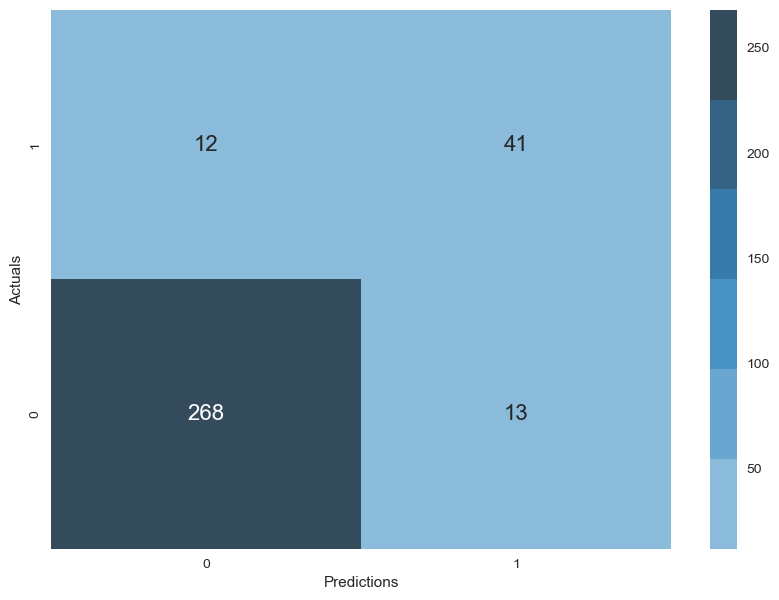

In [78]:
print(recall_score(y_valid, y_preds))
print('Confusion Matrix for Model Before Tuning')
plot_conf_matrix(y_valid, y_preds)

# Model Tuning & GridSearch

In [79]:
from imblearn.pipeline import Pipeline as imbpipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import make_scorer, recall_score

# Define your steps
numeric_features = ['total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition']
numeric_transformer = StandardScaler()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ])

steps = [('preprocessor', preprocessor), ('smote', SMOTE(sampling_strategy=1)), ('classifier', GradientBoostingClassifier())]

# Create the pipeline
imbalanced_pipeline = imbpipeline(steps)

# Define the parameter grid
param_grid = {
    "smote__sampling_strategy": [1],
    "classifier__loss": ['deviance', 'exponential'],
    "classifier__n_estimators": [100, 150],
    "classifier__max_depth": [3, 5],
    "classifier__max_features": ['auto', 8, None]
}



In [80]:
param_grid = {
            "ColumnTransformer__columns": [['account length', 'international plan', 'voice mail plan',
                                           'number vmail messages', 'total day minutes', 'total day calls',
                                           'total day charge', 'total eve minutes', 'total eve calls',
                                           'total eve charge', 'total night minutes', 'total night calls',
                                           'total night charge', 'total intl minutes', 'total intl calls',
                                           'total intl charge', 'customer service calls'],
                                          ['account length', 'international plan', 'voice mail plan',
                                           'number vmail messages', 'total day minutes', 'total day calls',
                                           'total day charge', 'total eve minutes', 'total eve calls',
                                           'total eve charge', 'total night minutes', 'total night calls',
                                           'total night charge', 'total intl minutes', 'total intl calls',
                                           'total intl charge', 'customer service calls', 'total charge', 
                                           'total minutes', 'total calls', 'avg minutes per domestic call',
                                           'competition']],
        "SMOTE__sampling_strategy": [1],
        "GradientBooster__loss": ['deviance', 'exponential'],
        "GradientBooster__n_estimators": [100, 150],
        "GradientBooster__max_depth": [3, 5],
        "GradientBooster__max_features": ['auto', 8, None]
}

In [81]:
gs_pipeline = GridSearchCV(pipeline, param_grid=param_grid, verbose=2, scoring=make_scorer(recall_score))
gs_pipeline.fit(X_train, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   0.4s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl 

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   0.0s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=devianc

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   0.0s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=devi

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   0.0s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=devianc

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   0.0s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=e

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   2.5s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=expo

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   0.0s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=e

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   5.0s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls'], GradientBooster__loss=expo

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   0.0s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes'

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   0.0s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', '

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   0.0s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes'

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=8, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   0.0s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', '

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=deviance, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   0.0s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes'

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=8, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   3.9s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes'

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   7.5s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minut

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=auto, GradientBooster__n_estimators=150, SMOTE__sampling_strategy=1; total time=   0.1s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minut

[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'total charge', 'total minutes', 'total calls', 'avg minutes per domestic call', 'competition'], GradientBooster__loss=exponential, GradientBooster__max_depth=5, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   8.0s
[CV] END ColumnTransformer__columns=['account length', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minut

GridSearchCV(estimator=Pipeline(steps=[('ColumnTransformer',
                                        SelectColumnsTransformer(columns=['account '
                                                                          'length',
                                                                          'international '
                                                                          'plan',
                                                                          'voice '
                                                                          'mail '
                                                                          'plan',
                                                                          'number '
                                                                          'vmail '
                                                                          'messages',
                                                                          'total '
                                                                          'charge',
                                                                          'customer '
                                                                          'service '
                                                                          'calls',
                                                                          'competition',
                                                                          'avg '
                                                                          'minutes '
                                                                          'per '
                                                                          'domestic '
                                                                          'call',
                                                                          'total '
                                                                          'calls',
                                                                          'total '
                                                                          'minutes'])),
                                       ('TransformCategorical',
                                        Transform_Categori...
                                                         'customer service '
                                                         'calls',
                                                         'total charge',
                                                         'total minutes',
                                                         'total calls',
                                                         'avg minutes per '
                                                         'domestic call',
                                                         'competition']],
                         'GradientBooster__loss': ['deviance', 'exponential'],
                         'GradientBooster__max_depth': [3, 5],
                         'GradientBooster__max_features': ['auto', 8, None],
                         'GradientBooster__n_estimators': [100, 150],
                         'SMOTE__sampling_strategy': [1]},
             scoring=make_scorer(recall_score), verbose=2)

In [82]:
gs_pipeline.best_estimator_

Pipeline(steps=[('ColumnTransformer',
                 SelectColumnsTransformer(columns=['account length',
                                                   'international plan',
                                                   'voice mail plan',
                                                   'number vmail messages',
                                                   'total day minutes',
                                                   'total day calls',
                                                   'total day charge',
                                                   'total eve minutes',
                                                   'total eve calls',
                                                   'total eve charge',
                                                   'total night minutes',
                                                   'total night calls',
                                                   'total night charge',
                                                   'total intl minutes',
                                                   'total intl calls',
                                                   'total intl charge',
                                                   'customer service calls',
                                                   'total charge',
                                                   'total minutes',
                                                   'total calls',
                                                   'avg minutes per domestic '
                                                   'call',
                                                   'competition'])),
                ('TransformCategorical', Transform_Categorical()),
                ('SMOTE', SMOTE(sampling_strategy=1)),
                ('GradientBooster',
                 GradientBoostingClassifier(loss='exponential', max_depth=5,
                                            n_estimators=150))])

In [83]:
gs_pipeline.best_params_

{'ColumnTransformer__columns': ['account length',
  'international plan',
  'voice mail plan',
  'number vmail messages',
  'total day minutes',
  'total day calls',
  'total day charge',
  'total eve minutes',
  'total eve calls',
  'total eve charge',
  'total night minutes',
  'total night calls',
  'total night charge',
  'total intl minutes',
  'total intl calls',
  'total intl charge',
  'customer service calls',
  'total charge',
  'total minutes',
  'total calls',
  'avg minutes per domestic call',
  'competition'],
 'GradientBooster__loss': 'exponential',
 'GradientBooster__max_depth': 5,
 'GradientBooster__max_features': None,
 'GradientBooster__n_estimators': 150,
 'SMOTE__sampling_strategy': 1}

In [84]:
best_model = gs_pipeline.best_estimator_
y_validation_preds = best_model.predict(X_valid)
recall_score(y_valid, y_validation_preds)

0.8301886792452831

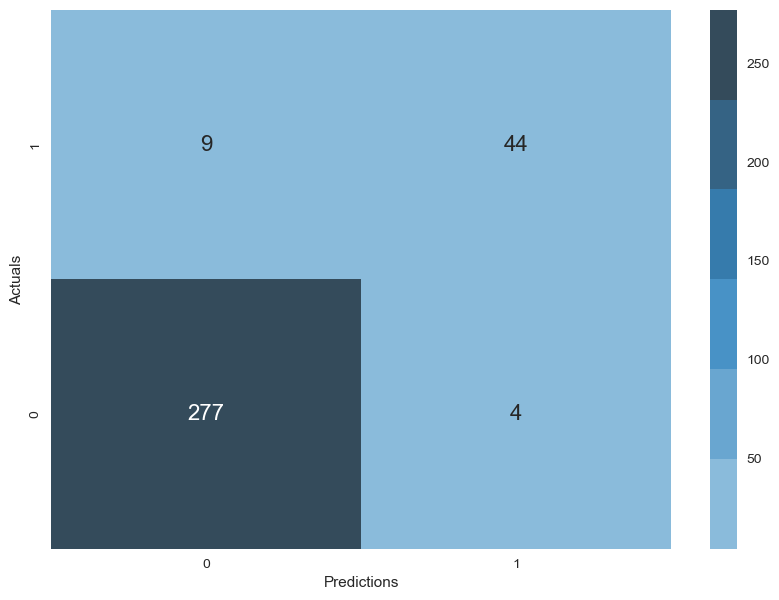

In [85]:
plot_conf_matrix(y_valid, y_validation_preds)

# Feature Importance

In [86]:
def plot_feature_importances(X, model):
    features = X.columns
    feat_imp_scores = model.feature_importances_
    plt.figure(figsize=(10, 8))
    plt.bar(features, feat_imp_scores, zorder=2, alpha=0.8)
    plt.grid(zorder=0)
    plt.xticks(rotation=90)
    plt.xlabel('Feature Importance')
    plt.ylabel('Features')
    plt.title('Feature Importances of Model')
    plt.show()

In [87]:
best_model.steps[3][1].feature_importances_

array([0.01964419, 0.05131759, 0.06926046, 0.07307382, 0.0130474 ,
       0.01255961, 0.00963026, 0.01265741, 0.01400722, 0.01025652,
       0.01162488, 0.01086588, 0.00872845, 0.01914729, 0.06003954,
       0.03636552, 0.14922463, 0.35391136, 0.02285243, 0.01635669,
       0.01992647, 0.00550238])

In [88]:
best_model.steps[0][1].columns

['account length',
 'international plan',
 'voice mail plan',
 'number vmail messages',
 'total day minutes',
 'total day calls',
 'total day charge',
 'total eve minutes',
 'total eve calls',
 'total eve charge',
 'total night minutes',
 'total night calls',
 'total night charge',
 'total intl minutes',
 'total intl calls',
 'total intl charge',
 'customer service calls',
 'total charge',
 'total minutes',
 'total calls',
 'avg minutes per domestic call',
 'competition']

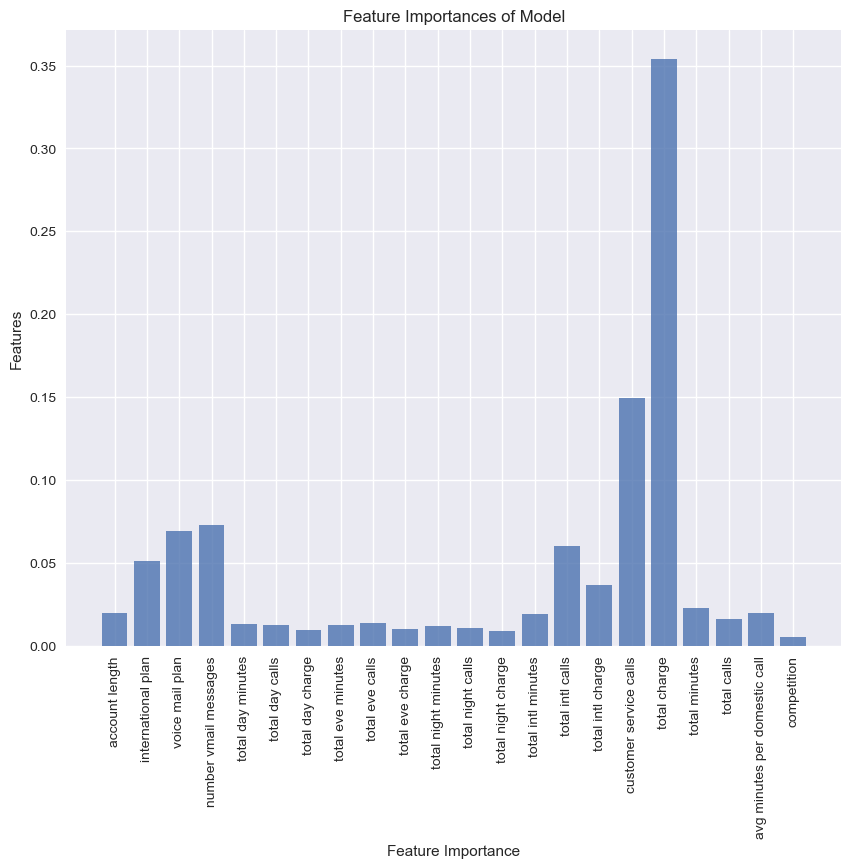

In [89]:
plot_feature_importances(X=best_model.steps[0][1], model=best_model.steps[3][1])

# New Model with Most Important Features
I will train a new model with just the top 8 features and test if these perform better or similar to our previous model to potentially save resources.

In [90]:
param_grid = {
    "ColumnTransformer__columns": [['total charge', 'customer service calls', 'number vmail messages',
                                     'voice mail plan', 'international plan', 'total intl calls',
                                     'total intl minutes', 'total intl charge']],
    "SMOTE__sampling_strategy": [1],
    "GradientBooster__n_estimators": [100, 150],
    "GradientBooster__max_depth": [3, 5],
    "GradientBooster__max_features": [None]
}


In [91]:
gs_pipeline = GridSearchCV(pipeline, param_grid=param_grid, verbose=2, scoring=make_scorer(recall_score))
gs_pipeline.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ColumnTransformer__columns=['total charge', 'customer service calls', 'number vmail messages', 'voice mail plan', 'international plan', 'total intl calls', 'total intl minutes', 'total intl charge'], GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.0s
[CV] END ColumnTransformer__columns=['total charge', 'customer service calls', 'number vmail messages', 'voice mail plan', 'international plan', 'total intl calls', 'total intl minutes', 'total intl charge'], GradientBooster__max_depth=3, GradientBooster__max_features=None, GradientBooster__n_estimators=100, SMOTE__sampling_strategy=1; total time=   1.0s
[CV] END ColumnTransformer__columns=['total charge', 'customer service calls', 'number vmail messages', 'voice mail plan', 'international plan', 'total intl calls', 'total intl minutes', 'total intl charge'], GradientBooster__

GridSearchCV(estimator=Pipeline(steps=[('ColumnTransformer',
                                        SelectColumnsTransformer(columns=['account '
                                                                          'length',
                                                                          'international '
                                                                          'plan',
                                                                          'voice '
                                                                          'mail '
                                                                          'plan',
                                                                          'number '
                                                                          'vmail '
                                                                          'messages',
                                                                          'total '
                                                                          'charge',
                                                                          'customer '
                                                                          'service '
                                                                          'calls',
                                                                          'competition',
                                                                          'avg '
                                                                          'minutes '
                                                                          'per '
                                                                          'domestic '
                                                                          'call',
                                                                          'total '
                                                                          'calls',
                                                                          'total '
                                                                          'minutes'])),
                                       ('TransformCategorical',
                                        Transform_Categori...
             param_grid={'ColumnTransformer__columns': [['total charge',
                                                         'customer service '
                                                         'calls',
                                                         'number vmail '
                                                         'messages',
                                                         'voice mail plan',
                                                         'international plan',
                                                         'total intl calls',
                                                         'total intl minutes',
                                                         'total intl charge']],
                         'GradientBooster__max_depth': [3, 5],
                         'GradientBooster__max_features': [None],
                         'GradientBooster__n_estimators': [100, 150],
                         'SMOTE__sampling_strategy': [1]},
             scoring=make_scorer(recall_score), verbose=2)

In [92]:
gs_pipeline.best_params_

{'ColumnTransformer__columns': ['total charge',
  'customer service calls',
  'number vmail messages',
  'voice mail plan',
  'international plan',
  'total intl calls',
  'total intl minutes',
  'total intl charge'],
 'GradientBooster__max_depth': 3,
 'GradientBooster__max_features': None,
 'GradientBooster__n_estimators': 100,
 'SMOTE__sampling_strategy': 1}

In [93]:
best_model = gs_pipeline.best_estimator_
y_validation_preds = best_model.predict(X_valid)

Final Testing Recall: 0.8301886792452831


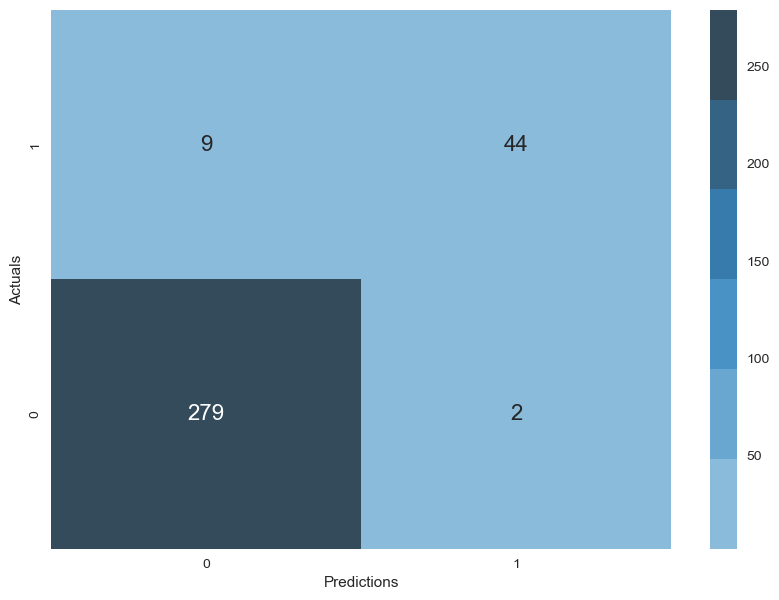

In [94]:
print('Final Testing Recall:', recall_score(y_valid, y_validation_preds))
plot_conf_matrix(y_valid, y_validation_preds)

Final Training Recall 0.8767441860465116


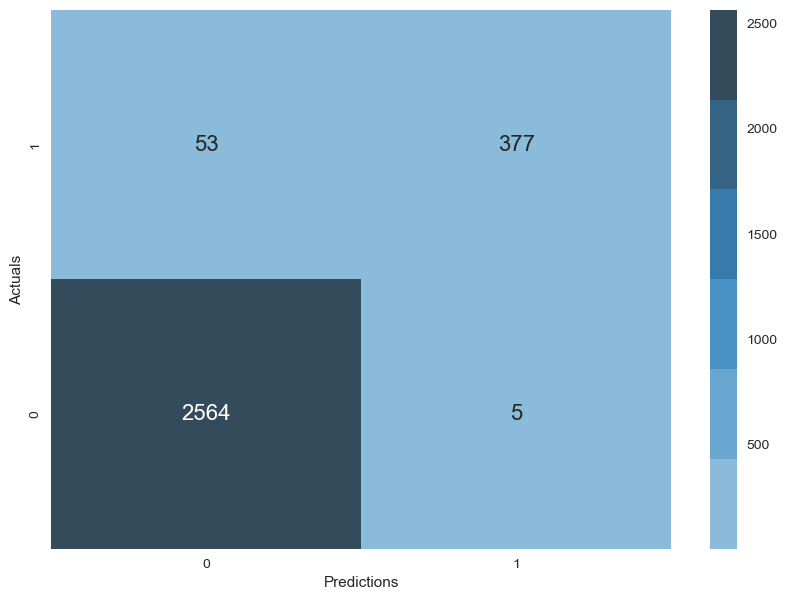

In [95]:
y_training_preds = best_model.predict(X_train)
print('Final Training Recall', recall_score(y_train, y_training_preds))
plot_conf_matrix(y_train, y_training_preds)

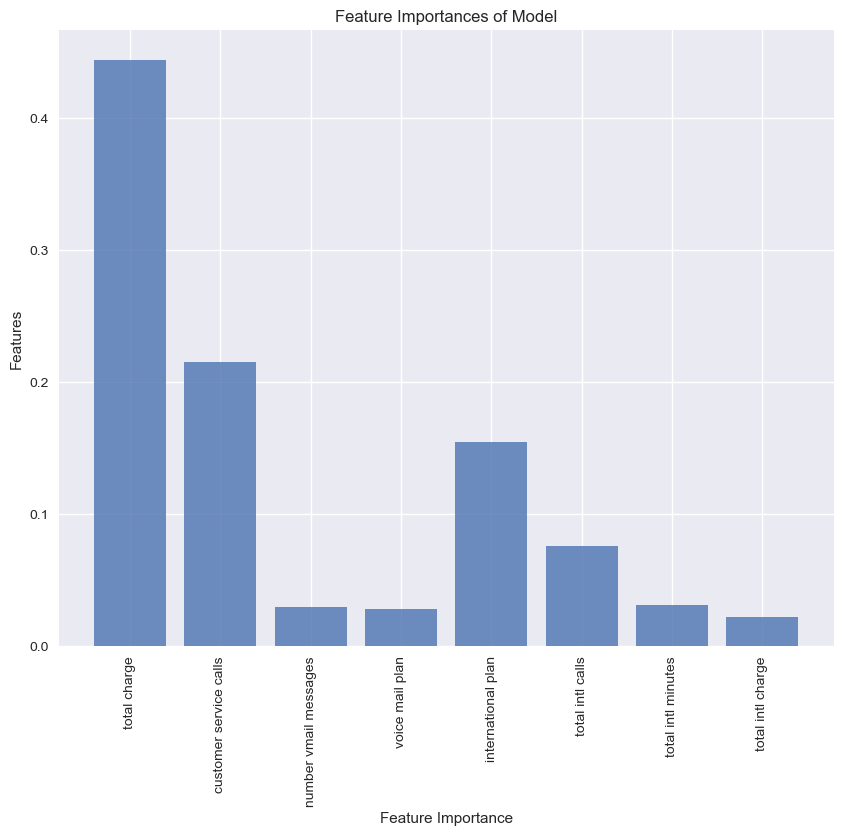

In [96]:
plot_feature_importances(X=best_model.steps[0][1], model=best_model.steps[3][1])

Matrix of Confusion and Cost-Benefit Evaluation Assume that giving a customer a 50% discount off one month of free service when they weren't actually going to churn is the cost of a False Positive. For the purposes of this research, we'll assume that each customer's FP costs $25 USD (-25).

As an alternative, the expense of a False Negative is having to go out and get a new customer, which costs $50 USD, as well as losing the customer and their $50 USD monthly payment. Thus, we will state that the price of a FN is equal to $100 USD for each client (-100).

Matrix of Confusion and Cost-Benefit Evaluation Assume that giving a customer a 50% discount off one month of free service when they weren't actually going to churn is the cost of a False Positive. For the purposes of this research, we'll assume that each customer's FP costs $25 USD (-25).

Retaining a True Positive entails allowing the customer to continue making their monthly payment of $50 USD, less the 50% reduction. Advantage of TP = 25

The benefit of a True Negative = 0 since we did not provide any discounts because we anticipated that they would not churn.

The function below takes these expenses and advantages into account.


In [97]:
def cost_benefit_analysis(model, X_test, y_test):
    # Make predictions using the model
    y_preds = model.predict(X_test)
    
    # Initialize a dictionary to keep track of counts for each label
    label_dict = {"TP": 0, "FP": 0, "TN": 0, "FN": 0}
    
    # Update counts based on true labels and predictions
    for yt, yp in zip(y_test, y_preds):
        if yt == yp:
            if yt == 1:
                label_dict["TP"] += 1
            else:
                label_dict["TN"] += 1
        else:
            if yp == 1:
                label_dict["FP"] += 1
            else:
                label_dict["FN"] += 1
    
    # Define a cost-benefit dictionary
    cb_dict = {"TP": 25, "FP": -25, "TN": 0, "FN": -100}
    
    # Calculate the total cost-benefit
    total = sum(cb_dict[key] * label_dict[key] for key in label_dict)
    
    # Calculate the average cost-benefit per observation
    avg_cost_benefit = total / sum(label_dict.values())
    
    return cb_dict, label_dict, avg_cost_benefit

# Example usage:
# Assuming you have a trained model 'trained_model', and test data 'X_test' and 'y_test'
# cb_dict, label_dict, avg_cost_benefit = cost_benefit_analysis(trained_model, X_test, y_test)

# Print the results
# print("Cost-Benefit Dictionary:", cb_dict)
# print("Label Counts:", label_dict)
# print("Average Cost-Benefit per Observation:", avg_cost_benefit)


In [98]:
cb_dict, label_dict, expected_value = cost_benefit_analysis(best_model, X_valid, y_valid)
print(cb_dict, label_dict)

{'TP': 25, 'FP': -25, 'TN': 0, 'FN': -100} {'TP': 44, 'FP': 2, 'TN': 279, 'FN': 9}


In [99]:
# Put the cost benefit values in an array to plot
cb_array = [[cb_dict['TN']*label_dict['TN'],
            cb_dict['FP']*label_dict['FP']],
            [cb_dict['FN']*label_dict['FN'],
            cb_dict['TP']*label_dict['TP']]]
cb_array

[[0, -50], [-900, 1100]]

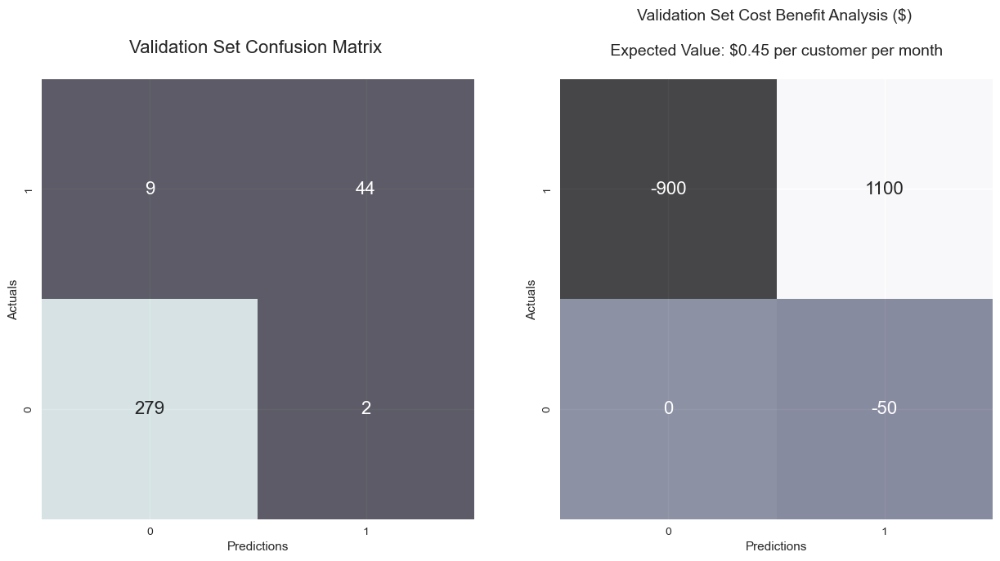

In [100]:
cm = confusion_matrix(y_valid, y_validation_preds)

fig, axes = plt.subplots(1, 2, figsize=(15, 7))

sns.heatmap(cm, annot=True, cmap=sns.color_palette('bone'), fmt='0.5g', cbar=False,
            annot_kws={'size': 16}, alpha=.7, ax=axes[0])

sns.heatmap(cb_array, annot=True, fmt='0.5g', cmap='bone', cbar=False,
            annot_kws={'size': 16}, alpha=.7, ax=axes[1])

plt.xlabel('Predictions')
plt.ylabel('Actuals')
axes[0].set_ylabel('Actuals')
axes[0].set_xlabel('Predictions')
axes[0].set_ylim([0,2])
axes[1].set_ylim([0,2])
axes[0].set_title('Validation Set Confusion Matrix \n', fontdict={'size': 16})
axes[1].set_title(f'Validation Set Cost Benefit Analysis ($) \n\n Expected Value: ${round(expected_value, 2)} per customer per month \n',
          fontdict={'size': 14})
plt.show()

Based on this cost benefit analysis, our expected value from this strategy is 45 cents per customer per month. That may not seem like much, but for millions of customers it would add up. The good news here is that with this model predicting churn, we are not LOSING money! We can see the breakdown of each cost and benefit multiplied by the number of TP, TN, FP, FNs on the confusion matrix above.





The final model had the following recall scores:

In [101]:
print('Validation Recall Score', round(recall_score(y_valid, y_validation_preds), 2))
print('Training Recall Score', round(recall_score(y_train, y_training_preds), 2))


Validation Recall Score 0.83
Training Recall Score 0.88


Since these recall scores are so close, we can assume the model is slightly overfit, but overall very good on recall. This model produced only 9 (2%) false negatives for the validation set. It produced only 1 (0.003%) false positive from the validation set, but if our customer retention strategy is to keep these customers engaged, it is not a bad thing to keep a customer engaged who is mispredicted as potentially exiting.

Finally, based on the cost benefit analysis of this model's predictive ability and the SyriaTel Communications strategy for customer retention, the expected value is 52 cents per customer per month. Over the course of a year and millions of customers nationwide, we can conclude that this strategy would make us a lot of money in the long run.

# conclusion
To sum up, phone calls to customer service appear to be one of the most significant markers of client attrition. Additionally, we observe increased churn in some states, albeit it's unclear from the data why some states have a higher churn rate. Additionally, it is evident that a higher percentage of consumers with foreign plans churn than those without, possibly due to dissatisfaction with their plans.


# findings and recomendations 

1.We currently have a 14.5% churn rate for the training data set. Examining customer support calls, we may observe that the probability of churning rises in tandem with the quantity of calls. In particular, the chance of a customer churning rises from roughly 10% to 50% after at least 4 customer service calls.

2.Calls to customer care do not by themselves ensure that a consumer will leave. Actually, most of the clients who DID NOT churn only placed one or two customer support calls. It's crucial to remember that the majority of DID churners made one to four customer support calls. Consequently, a client's likelihood of churning should be shown if they have made more than three calls to customer support.

Recomendation : In light of these results, I would advise reviewing our customer service procedure. Offering a bigger incentive or discount to clients who contact customer support more than three times could be beneficial.


3.It is evident that the utilization of day, night, and international calls was nearly same for both the consumers who did not churn and the ones who did. Regardless of whether the consumer has an international plan or not, the charges for foreign minutes are the same (27 cents per minute). It's also noteworthy that a higher proportion of international plan subscribers than non-international plan subscribers experienced consumer attrition. It's probable that consumers with international plans who churned did not think paying for the international plan was worthwhile because of this comparable cost for international calls.

>>>>These results lead me to suggest adjusting the international minute rates.  Customers with international plans should be able to make international calls at a lower cost than those without one.

4.It is evident that certain states have far greater churn than others. Texas has the most state-level turnover (27%), compared to all other states. California, Maryland, and New Jersey too have greater turnover rates (above 23%). Hawaii and Iowa have the lowest churn rates (less than.05%).


5.The variation in churn between states may be caused by several factors. One explanation might be the dearth of rivals in more remote locations like Hawaii and Iowa. There may be numerous other significant companies in the industry in states like Texas, California, or New Jersey, giving our clients more options if they decide to leave. Another factor can be the poor quality of service in some
 
>>>>>>>In light of these results, I advise investigating competitors in high-churn jurisdictions such as Texas, California, New Jersey, and others to see whether they are running any initial promotions that could force some of our clients to leave. In order to determine whether any deadzones are causing the higher rates, I also advise examining the cell signal in these states with higher churn.


Obtain additional information on rivals in states with greater churn.

Obtain additional cell signal data across the United States to identify trends in states with greater churn rates.

Examine voicemail logs to determine whether it could be a useful predictor.

# THANK YOU 

# Deployment